In [1]:
import warnings
warnings.filterwarnings("ignore")
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import requests
import scipy
# import tensorflow as tf
# from sklearn.manifold import TSNE
import sompylib.sompy as SOM
from time import time
import random
%matplotlib inline

## Loading the data


##  Small data set 1

In [2]:

# In total there are 7085 records (the ones I can calculate with an ordinary laptop in 5 minutes). Each record consists of 87 entries:
# 1-12: X, Y, Z coordinates of 4 moving nodes in the form diagram;
# 13-27: magnitudes of the inner forces in the 15 bars;
# 28-87:  X, Y, Z coordinates of 20 nodes of the force diagram.
 
# If possible, I would make a first test with the entries 1-27, thus excluding the position of the nodes of the force diagram. These ones could be used for a second test (entries 1-87).

In [17]:
# path= './ForceDiagram_Machine.txt'
Target_size = 12
path= './180116_ForceDiagram_Machine.txt'
DF = pd.read_csv(path,header=None,sep=';')
print (DF.shape)
std1 = DF.describe().ix['std'].copy()
# np.around(std1,decimals=2)

(45007, 87)


In [18]:
geom_coords_size = 12
Target_size = 12
force_coords_size = 60

force_magnitudes_range = range(geom_coords_size,DF.shape[1]-force_coords_size)
len(force_magnitudes_range)

15

In [6]:

path = './ForceDiagram_Machine_Basic_4Nodes_2.csv'
DF = pd.read_csv(path,header=None,sep=',')
print (DF.shape)
std2= DF.describe().ix['std'].copy()

(8835, 72)


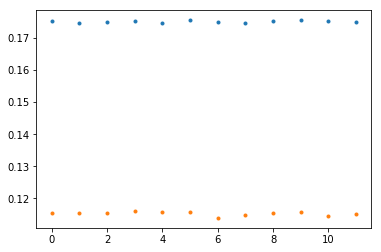

In [7]:
plt.plot(std1.values[:12],'.');
plt.plot(std2.values[:12],'.')

## Complex data set

In [ ]:
# There are 9349 records (generated in 5 min), each with 763 values:
# ·coordinates of 62 nodes (186 values) from form diagram;
# ·magnitudes of forces (181 values);
# ·coordinates of 132 nodes (396 values) from force diagram.
 

In [120]:
# path= './ForceDiagram_Machine.txt'
path= './180127_ForceDiagram_Machine.txt'
path= './ComplexForceDiagram_Machine/ComplexForceDiagram_Machine.csv'
DF = pd.read_csv(path,header=None,sep=';')

In [121]:
geom_coords_size = 186
Target_size = 186
force_coords_size = 396

force_magnitudes_range = range(geom_coords_size,DF.shape[1]-force_coords_size)
len(force_magnitudes_range)

181

# Simple data set 2

In [54]:
# Each record is 213 elements
# 45 X, Y, Z coordinates of the 15 nodes of the form diagram;
# 39 magnitudes of the inner forces;
# 129 X, Y, Z coordinates of the nodes of the force diagram

In [55]:
path= './SimpleForceDiagram_Machine/SimpleForceDiagram_Machine.csv'
DF = pd.read_csv(path,header=None,sep=',')

In [56]:
geom_coords_size = 45
Target_size = 45
force_coords_size = 129

force_magnitudes_range = range(geom_coords_size,DF.shape[1]-force_coords_size)
len(force_magnitudes_range)

39

# Simpla data set with 5 moving nodes

In [ ]:

# 45 X, Y, Z coordinates of the 15 nodes of the form diagram 
#(the first 10 are fixed and the last 5 nodes move); 
#39 magnitudes of the inner forces; 
#129 X, Y, Z coordinates of the nodes of the force diagram

In [74]:
path= './SimpleForceDiagram_Machine_5Nodes.csv'
DF = pd.read_csv(path,header=None,sep=',')

In [75]:
geom_coords_size = 45
Target_size = 45
force_coords_size = 129
geom_coords =np.arange(geom_coords_size)
force_magnitudes_range = np.arange(geom_coords_size,DF.shape[1]-force_coords_size)
len(force_magnitudes_range)

39

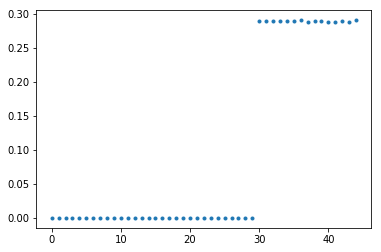

In [76]:
plt.plot(DF[geom_coords].describe().ix['std'],'.');

In [77]:
# We just take the last five nodes
print (DF.shape)
DF = DF[np.arange(30,DF.shape[1])]
DF.columns = np.arange(DF.shape[1])
print (DF.shape)
geom_coords_size = 15
Target_size = 15
geom_coords =np.arange(geom_coords_size)
force_coords_size = 129
geom_coords =np.arange(geom_coords_size)
force_magnitudes_range = np.arange(geom_coords_size,DF.shape[1]-force_coords_size)
len(force_magnitudes_range)

(20294, 213)
(20294, 183)


39

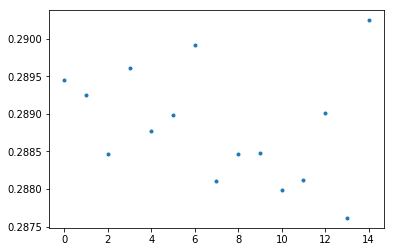

In [78]:
plt.plot(DF[geom_coords].describe().ix['std'],'.');

In [79]:
DF.head()

,0,1,2,3,4,5,6,7,8,9,...,173,174,175,176,177,178,179,180,181,182
0,-20.455713,-269.579341,-0.741259,-20.172076,-262.937598,4.650775,-27.553200,-269.024720,4.733487,-30.141857,...,9.252111,0.936971,-338.595597,8.109990,-16.607961,-320.974806,5.542629,2.736979,-328.667330,11.109990
1,-20.455713,-269.579341,-0.741259,-20.172076,-262.937598,4.650775,-27.553200,-269.024720,4.733487,-30.141857,...,9.252111,0.936971,-338.595597,8.109990,-16.607961,-320.974806,5.542629,2.736979,-328.667330,11.109990
2,-20.293755,-269.324971,-0.643418,-19.883607,-263.293413,4.734514,-27.981400,-269.449780,5.504132,-29.528214,...,9.520750,1.517244,-339.279171,8.394430,-16.151674,-321.555059,5.764831,3.317252,-329.283419,11.394430
3,-19.903386,-269.133016,-1.306162,-20.650146,-263.301297,4.916178,-27.201884,-269.345347,5.174567,-29.665646,...,9.668412,0.605991,-337.368600,8.242021,-16.867420,-319.807410,5.710562,2.405999,-327.479262,11.242021
4,-19.990591,-269.647643,-1.269919,-20.203241,-262.857696,4.971740,-27.974312,-268.739229,4.968719,-29.434327,...,9.531051,-0.385200,-338.274189,8.061103,-17.918127,-320.663402,5.499768,1.414808,-328.352457,11.061103


In [59]:
# from mpl_toolkits.mplot3d import Axes3D
# fig = plt.figure(figsize=(25,25))
# which = 0
# howmany = 50.
# ax = fig.add_subplot(1,1,1, projection='3d')  
# for kk, f in enumerate(range(which,which+int(howmany))):
#     coords = DF.values[f,:12]
      
#     #Horizontal lines in each layer
#     coords = coords.reshape(4,3)
#     ax.plot3D(coords[:,0], coords[:,1], coords[:,2],'o-',color=plt.cm.jet(f/howmany), linewidth=1.7, antialiased=True)
#     ax.plot3D(coords[[0,3],0], coords[[0,3],1],coords[[0,3],2],color=plt.cm.jet(f/howmany), linewidth=1.7, antialiased=True)

# plt.tight_layout()
# plt.show()

In [19]:
DF = DF.dropna()
DF.shape

(45007, 87)

In [124]:
# # plt.hist(X[:,-1],bins=100);
# X = DF.values[:,:27].astype(float)
# # plt.hist(X[:,-1],bins=100);
# fig = plt.figure(figsize=(10,10))
# for i in range(X.shape[1]):
#     plt.subplot(7,4,i+1)
#     plt.plot(X[:,i],'.',markersize=.4)

# We remove rows with extream values
## REMOVE OUTLIERS BASED ON MAGNITUDE OF FORCES ONLY

## Absulutely essential

In [20]:
if Target_size ==12:
    stat = DF.describe(percentiles=[.01,.05,.95,.99])
    mn= stat.ix['1%'].values[:]
    mx= stat.ix['99%'].values[:]
    mean =  stat.ix['mean'].values[:]
    stat
elif Target_size==186:
    stat = DF.describe(percentiles=[.01,.05,.95,.99])
    mn= stat.ix['5%'].values[:]
    mx= stat.ix['95%'].values[:]    
    mean =  stat.ix['mean'].values[:]

elif Target_size==45:
    stat = DF.describe(percentiles=[.01,.05,.95,.99])
    mn= stat.ix['1%'].values[:]
    mx= stat.ix['99%'].values[:]    
    mean =  stat.ix['mean'].values[:]

elif Target_size==15:
    stat = DF.describe(percentiles=[.01,.05,.95,.99])
    mn= stat.ix['1%'].values[:]
    mx= stat.ix['99%'].values[:]    
    mean =  stat.ix['mean'].values[:]

    stat
#     pass
stat

,0,1,2,3,4,5,6,7,8,9,...,77,78,79,80,81,82,83,84,85,86
count,45007.000000,45007.000000,45007.000000,45007.000000,45007.000000,45007.000000,45007.000000,45007.000000,45007.000000,45007.000000,...,45007.000000,4.500700e+04,45007.000000,45007.000000,4.500700e+04,45007.000000,45007.000000,4.500700e+04,45007.000000,45007.000000
mean,-0.328795,-0.112855,0.271096,-0.291926,-0.773649,0.273282,-1.721690,-0.566911,0.272461,-1.570427,...,9.405027,-4.531204e+01,-24.599634,19.253635,-4.532006e+01,-24.507221,19.722407,-3.372341e+01,-3.150667,11.150298
std,0.175257,0.174647,0.174872,0.175433,0.174698,0.175549,0.175000,0.174833,0.175445,0.175480,...,2571.347275,1.120062e+04,6270.485137,2340.334818,1.119932e+04,6283.029551,2326.616838,9.492811e+03,1025.660720,2893.014913
min,-0.630488,-0.413672,-0.027579,-0.591204,-1.073193,-0.027579,-2.021945,-0.866129,-0.027579,-1.870335,...,-190160.456062,-2.154538e+06,-727942.365083,-120618.260858,-2.154538e+06,-727943.731180,-120621.458338,-1.815436e+06,-45779.688653,-244516.922304
1%,-0.624428,-0.407612,-0.027579,-0.591204,-1.067133,-0.021518,-2.015884,-0.866129,-0.021518,-1.870335,...,-63.664317,-5.076279e+02,-560.169385,-239.424537,-4.941769e+02,-540.767631,-221.260135,-3.614997e+02,-93.831500,-72.256795
5%,-0.606246,-0.389430,-0.003336,-0.560901,-1.042890,0.002724,-1.991642,-0.835826,0.002724,-1.840032,...,-12.090164,-9.649428e+01,-92.038727,-37.750892,-9.476053e+01,-89.460561,-43.907699,-7.896052e+01,-25.122046,-14.430850
50%,-0.327458,-0.110642,0.269391,-0.294235,-0.776223,0.275451,-1.718915,-0.569159,0.269391,-1.573366,...,0.214721,-3.338538e+00,-8.171933,1.898286,-3.264277e+00,-8.012918,2.013765,-3.680305e+00,-9.246104,0.330059
95%,-0.054731,0.162085,0.542118,-0.021507,-0.503496,0.548179,-1.452248,-0.296432,0.548179,-1.294578,...,11.760743,9.882296e+01,78.700730,33.192339,9.778458e+01,75.927651,42.934211,7.768563e+01,7.641339,13.850319
99%,-0.030488,0.186328,0.566361,0.002735,-0.473193,0.572421,-1.428005,-0.266129,0.572421,-1.270335,...,54.353405,5.748367e+02,571.719005,232.319948,5.670091e+02,559.056055,218.393735,4.292777e+02,69.281910,66.695862
max,-0.030488,0.186328,0.572421,0.008796,-0.473193,0.572421,-1.421945,-0.266129,0.572421,-1.270335,...,505385.554454,8.665128e+05,838901.641590,353977.008230,8.665126e+05,838902.725309,353979.162446,7.829952e+05,171463.446696,554978.934647


In [21]:
stat

,0,1,2,3,4,5,6,7,8,9,...,77,78,79,80,81,82,83,84,85,86
count,45007.000000,45007.000000,45007.000000,45007.000000,45007.000000,45007.000000,45007.000000,45007.000000,45007.000000,45007.000000,...,45007.000000,4.500700e+04,45007.000000,45007.000000,4.500700e+04,45007.000000,45007.000000,4.500700e+04,45007.000000,45007.000000
mean,-0.328795,-0.112855,0.271096,-0.291926,-0.773649,0.273282,-1.721690,-0.566911,0.272461,-1.570427,...,9.405027,-4.531204e+01,-24.599634,19.253635,-4.532006e+01,-24.507221,19.722407,-3.372341e+01,-3.150667,11.150298
std,0.175257,0.174647,0.174872,0.175433,0.174698,0.175549,0.175000,0.174833,0.175445,0.175480,...,2571.347275,1.120062e+04,6270.485137,2340.334818,1.119932e+04,6283.029551,2326.616838,9.492811e+03,1025.660720,2893.014913
min,-0.630488,-0.413672,-0.027579,-0.591204,-1.073193,-0.027579,-2.021945,-0.866129,-0.027579,-1.870335,...,-190160.456062,-2.154538e+06,-727942.365083,-120618.260858,-2.154538e+06,-727943.731180,-120621.458338,-1.815436e+06,-45779.688653,-244516.922304
1%,-0.624428,-0.407612,-0.027579,-0.591204,-1.067133,-0.021518,-2.015884,-0.866129,-0.021518,-1.870335,...,-63.664317,-5.076279e+02,-560.169385,-239.424537,-4.941769e+02,-540.767631,-221.260135,-3.614997e+02,-93.831500,-72.256795
5%,-0.606246,-0.389430,-0.003336,-0.560901,-1.042890,0.002724,-1.991642,-0.835826,0.002724,-1.840032,...,-12.090164,-9.649428e+01,-92.038727,-37.750892,-9.476053e+01,-89.460561,-43.907699,-7.896052e+01,-25.122046,-14.430850
50%,-0.327458,-0.110642,0.269391,-0.294235,-0.776223,0.275451,-1.718915,-0.569159,0.269391,-1.573366,...,0.214721,-3.338538e+00,-8.171933,1.898286,-3.264277e+00,-8.012918,2.013765,-3.680305e+00,-9.246104,0.330059
95%,-0.054731,0.162085,0.542118,-0.021507,-0.503496,0.548179,-1.452248,-0.296432,0.548179,-1.294578,...,11.760743,9.882296e+01,78.700730,33.192339,9.778458e+01,75.927651,42.934211,7.768563e+01,7.641339,13.850319
99%,-0.030488,0.186328,0.566361,0.002735,-0.473193,0.572421,-1.428005,-0.266129,0.572421,-1.270335,...,54.353405,5.748367e+02,571.719005,232.319948,5.670091e+02,559.056055,218.393735,4.292777e+02,69.281910,66.695862
max,-0.030488,0.186328,0.572421,0.008796,-0.473193,0.572421,-1.421945,-0.266129,0.572421,-1.270335,...,505385.554454,8.665128e+05,838901.641590,353977.008230,8.665126e+05,838902.725309,353979.162446,7.829952e+05,171463.446696,554978.934647


In [22]:

Data = DF.values[:,:].astype(float)
ind = ((Data[:,force_magnitudes_range]> mx[force_magnitudes_range]).sum(axis=1) +(Data[:,force_magnitudes_range] < mn[force_magnitudes_range]).sum(axis=1)==0)
Data = Data[ind]
    
    
Data.shape

(41048, 87)

In [128]:
# Data = DF.values[:,:].astype(float)
# for i in range(Data.shape[1]):
#     ind = Data[:,i]> mx[i]
#     Data[:,i][ind] = mx[i]
    
    
#     ind = Data[:,i] < mn[i]
#     Data[:,i][ind] = mn[i]

# # print np.min(X[:,:10],axis=1)

# # Data = Data-mean

# Data.shape

In [24]:
from sklearn.model_selection import train_test_split


#Without force_magnitudes
# indX = range(Target_size+len(force_magnitudes_range),Data.shape[1])


#With force_magnitudes
indX = range(Target_size,Data.shape[1])

indTarget = range(Target_size)
Forces = Data[:,indX]
Forms = Data[:,indTarget]
X_train, X_test, y_train, y_test = train_test_split(Forces, Forms, test_size=0.3, random_state=42)
# X_train, X_test, y_train, y_test = train_test_split(Forms, Forces, test_size=0.05, random_state=42)

from sklearn import preprocessing
X_train= preprocessing.scale(X_train)
X_test = preprocessing.scale(X_test)

# y_train= preprocessing.scale(y_train)
# y_test = preprocessing.scale(y_test)

y_test = y_test[:,:]
y_train = y_train[:,:]

X_train = X_train[:,-force_coords_size:]
X_test = X_test[:,-force_coords_size:]

# X_train = X_train[:,force_magnitudes_range]
# X_test = X_test[:,force_magnitudes_range]

X_train = X_train[:,:]
X_test = X_test[:,:]

print (X_train.shape, y_train.shape)
print (X_test.shape, y_test.shape)

(28733, 60) (28733, 12)
(12315, 60) (12315, 12)


In [130]:
# x1 = np.random.randn(10000,4)
# # y1 = (x1**1).sum(axis=1)[:,np.newaxis]
# y1 = np.sin(x1[:,0]) * np.exp(x1[:,1]) + np.cos(x1[:,2]**2) + np.power(x1[:,3],5)
# y1 = y1[:,np.newaxis]
# plt.plot(x1[:,0],y1,'.')

# X_train, X_test, y_train, y_test = train_test_split(x1, y1, test_size=0.05, random_state=42)
# print (X_train.shape, y_train.shape)

In [26]:
from keras.models import Sequential
from keras.layers import Dense
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
import numpy
from keras.optimizers import SGD
from keras.layers import Dropout
from keras.layers.normalization import BatchNormalization
from keras.layers import Activation

%matplotlib inline


if Target_size==186:
    batch_size =100
    # Network Parameters
    n_hidden_1 = 600 # 1st layer number of neurons
    n_hidden_2 = 400 # 2nd layer number of neurons
    n_hidden_3 = 600 # 3rd layer number of neurons
    n_hidden_4 = 200 # 4th layer number of neurons
    num_input = X_train.shape[1] 
    num_classes = y_train.shape[1] 


    # create model
    model = Sequential()
    model.add(Dense(n_hidden_1, input_dim=num_input, init='uniform'))
    # model.add(BatchNormalization())
    model.add(Activation('tanh'))
    model.add(Dropout(0.1))
    
    model.add(Dense(n_hidden_2, init='uniform'))
    # model.add(BatchNormalization())
    model.add(Activation('tanh'))
    model.add(Dropout(0.2))


    model.add(Dense(n_hidden_3, init='uniform'))
    # model.add(BatchNormalization())
    model.add(Activation('tanh'))
    model.add(Dropout(0.2))


#     model.add(Dense(n_hidden_4, init='uniform'))
#     # model.add(BatchNormalization())
#     model.add(Activation('tanh'))

    model.add(Dense(num_classes, init='uniform', activation='linear'))

    
    
if Target_size==45:
    batch_size = 30
    # Network Parameters
    n_hidden_1 = 250 # 1st layer number of neurons
    n_hidden_2 = 240 # 2nd layer number of neurons
    n_hidden_3 = 128 # 3rd layer number of neurons
    n_hidden_4 = 160 # 4th layer number of neurons
    num_input = X_train.shape[1] # MNIST data input (img shape: 28*28)
    num_classes = y_train.shape[1] # MNIST total classes (0-9 digits)

    # create model
    model = Sequential()
    model.add(Dense(n_hidden_1, input_dim=num_input, init='normal'))
#     model.add(BatchNormalization())
    model.add(Activation('tanh'))

    model.add(Dense(n_hidden_2, init='normal'))
#     model.add(BatchNormalization())
    model.add(Activation('tanh'))
    # model.add(Dropout(0.2))


    model.add(Dense(n_hidden_3, init='normal'))
    # model.add(BatchNormalization())
    model.add(Activation('tanh'))

#     model.add(Dense(n_hidden_4, init='uniform'))
#     # model.add(BatchNormalization())
#     model.add(Activation('tanh'))

    model.add(Dense(num_classes, init='uniform', activation='linear'))

    

if Target_size==12:
    batch_size = 50
    # Network Parameters
    n_hidden_1 = 140 # 1st layer number of neurons
    n_hidden_2 = 80 # 2nd layer number of neurons
    n_hidden_3 = 40 # 3rd layer number of neurons
    n_hidden_4 = 160 # 4th layer number of neurons
    num_input = X_train.shape[1] 
    num_classes = y_train.shape[1] 


    # create model
    model = Sequential()
    model.add(Dense(n_hidden_1, input_dim=num_input, init='uniform'))
#     model.add(BatchNormalization())
    model.add(Activation('tanh'))

    model.add(Dense(n_hidden_2, init='uniform'))
#     model.add(BatchNormalization())
    model.add(Activation('tanh'))
    # model.add(Dropout(0.2))


    model.add(Dense(n_hidden_3, init='uniform'))
#     # model.add(BatchNormalization())
    model.add(Activation('tanh'))

#     model.add(Dense(n_hidden_4, init='uniform'))
#     # model.add(BatchNormalization())
#     model.add(Activation('tanh'))

    model.add(Dense(num_classes, init='uniform', activation='linear'))

if Target_size==15:
    batch_size = 50
    # Network Parameters
    n_hidden_1 = 200 # 1st layer number of neurons
    n_hidden_2 = 160 # 2nd layer number of neurons
    n_hidden_3 = 120 # 3rd layer number of neurons
    n_hidden_4 = 160 # 4th layer number of neurons
    num_input = X_train.shape[1] 
    num_classes = y_train.shape[1] 


    # create model
    model = Sequential()
    model.add(Dense(n_hidden_1, input_dim=num_input, init='uniform'))
#     model.add(BatchNormalization())
    model.add(Activation('tanh'))

    model.add(Dense(n_hidden_2, init='uniform'))
#     model.add(BatchNormalization())
    model.add(Activation('tanh'))
    # model.add(Dropout(0.2))


    model.add(Dense(n_hidden_3, init='uniform'))
    # model.add(BatchNormalization())
    model.add(Activation('tanh'))

#     model.add(Dense(n_hidden_4, init='uniform'))
#     # model.add(BatchNormalization())
#     model.add(Activation('tanh'))

    model.add(Dense(num_classes, init='uniform', activation='linear'))


    
    
    
# Compile model

model.compile(loss='mse', optimizer='adam', metrics=['accuracy'])


# SGD is very slow
# sgd = SGD(lr=0.1, momentum=0.9, decay=0.0, nesterov=False)
# model.compile(loss='mse', optimizer='sgd', metrics=['accuracy'])


# Fit the model
model.fit(X_train, y_train, nb_epoch=150, batch_size=batch_size,  verbose=1)

# Calculate predictions
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

Epoch 1/150
28733/28733 [==============================] - 1s 34us/step - loss: 0.0627 - acc: 0.2544
Epoch 2/150
28733/28733 [==============================] - 1s 28us/step - loss: 0.0275 - acc: 0.2700
Epoch 3/150
28733/28733 [==============================] - 1s 28us/step - loss: 0.0262 - acc: 0.3432
Epoch 4/150
28733/28733 [==============================] - 1s 28us/step - loss: 0.0244 - acc: 0.4271
Epoch 5/150
28733/28733 [==============================] - 1s 28us/step - loss: 0.0205 - acc: 0.5043
Epoch 6/150
28733/28733 [==============================] - 1s 25us/step - loss: 0.0180 - acc: 0.5788
Epoch 7/150
28733/28733 [==============================] - 1s 26us/step - loss: 0.0165 - acc: 0.6280
Epoch 8/150
28733/28733 [==============================] - 1s 27us/step - loss: 0.0153 - acc: 0.6562
Epoch 9/150
28733/28733 [==============================] - 1s 29us/step - loss: 0.0139 - acc: 0.6785
Epoch 10/150
28733/28733 [==============================] - 1s 30us/step - loss: 0.0125 - a

28733/28733 [==============================] - 1s 29us/step - loss: 0.0016 - acc: 0.8863
Epoch 82/150
28733/28733 [==============================] - 1s 27us/step - loss: 0.0016 - acc: 0.8858
Epoch 83/150
28733/28733 [==============================] - 1s 27us/step - loss: 0.0016 - acc: 0.8878
Epoch 84/150
28733/28733 [==============================] - 1s 28us/step - loss: 0.0016 - acc: 0.8879
Epoch 85/150
28733/28733 [==============================] - 1s 28us/step - loss: 0.0015 - acc: 0.8884
Epoch 86/150
28733/28733 [==============================] - 1s 28us/step - loss: 0.0016 - acc: 0.8877
Epoch 87/150
28733/28733 [==============================] - 1s 29us/step - loss: 0.0015 - acc: 0.8893
Epoch 88/150
28733/28733 [==============================] - 1s 30us/step - loss: 0.0015 - acc: 0.8904
Epoch 89/150
28733/28733 [==============================] - 1s 29us/step - loss: 0.0015 - acc: 0.8895
Epoch 90/150
28733/28733 [==============================] - 1s 30us/step - loss: 0.0015 - acc: 

0.9679615873807569
0.9735273784800084
0.9771599437655532
0.9487423196213846
0.9545914805354144
0.9121917431582461
0.845504869705425
0.941488569413632
0.9299826060073074
0.87477678712088
0.974393597128232
0.9599921405892097


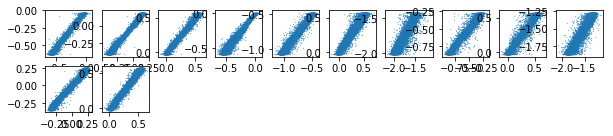

In [27]:
# plt.hist(X[:,-1],bins=100);
fig = plt.figure(figsize=(10,10))
sum_rs = []
for i in range(y_test.shape[1]):
    plt.subplot(10,10,i+1)
    plt.plot(y_pred_test[:,i],y_test[:,i],'.',markersize=.4)
    s = r2_score(y_pred_test[:,i],y_test[:,i])
    sum_rs.append(s)
    print (s)

In [28]:
y_pred_test.shape

(12315, 12)

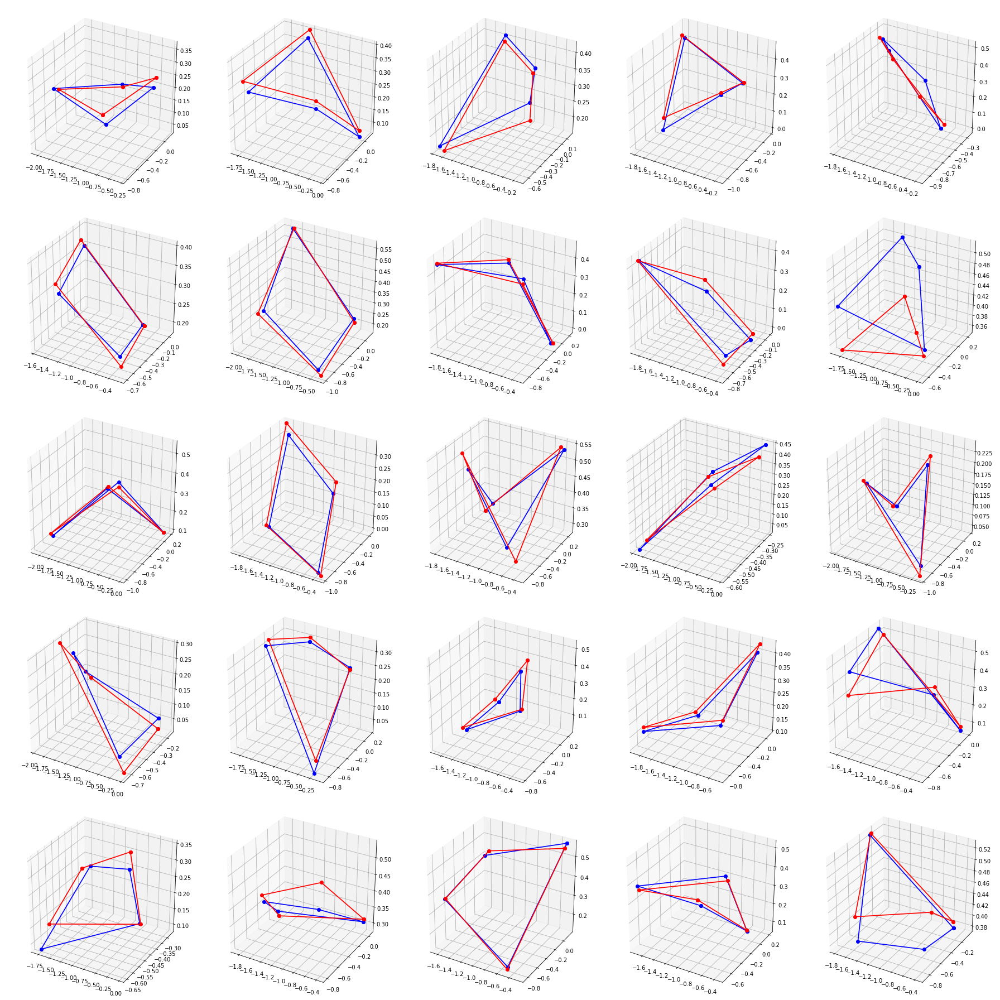

In [29]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(25,25))
which = 40
howmany = 25.
for kk, f in enumerate(range(which,which+int(howmany))):
    ax = fig.add_subplot(5,5,kk+1, projection='3d')  

    coords = y_test[f,:12]
      
    #Horizontal lines in each layer
    coords = coords.reshape(4,3)
    ax.plot3D(coords[:,0], coords[:,1], coords[:,2],'o-b', linewidth=1.7, antialiased=True)
    ax.plot3D(coords[[0,3],0], coords[[0,3],1],coords[[0,3],2],'o-b', linewidth=1.7, antialiased=True)

    coords = y_pred_test[f,:12]
      
    #Horizontal lines in each layer
    coords = coords.reshape(4,3)
    ax.plot3D(coords[:,0], coords[:,1], coords[:,2],'o-r', linewidth=1.7, antialiased=True)
    ax.plot3D(coords[[0,3],0], coords[[0,3],1],coords[[0,3],2],'o-r', linewidth=1.7, antialiased=True)

plt.tight_layout()
plt.show()

0.9860960001365305
0.984289741057507
0.9798664746035376
0.9657388229451287
0.9644336389888218
0.9371888758386364
0.8835819801980631
0.9582184938253986
0.9443570663741041
0.9127851528069048
0.9782599378069774
0.9694197526657939


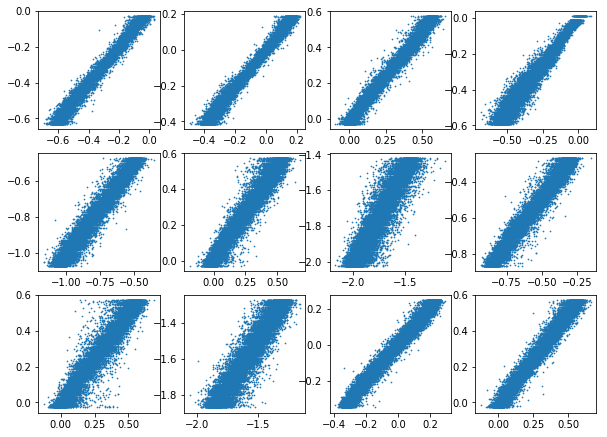

In [30]:
# plt.hist(X[:,-1],bins=100);
fig = plt.figure(figsize=(10,10))
for i in range(y_train.shape[1]):
    plt.subplot(4,4,i+1)
    plt.plot(y_pred_train[:,i],y_train[:,i],'.',markersize=1.4)
    print (r2_score(y_pred_train[:,i],y_train[:,i]))
#     plt.xlim(y_train[:,i].min(),)

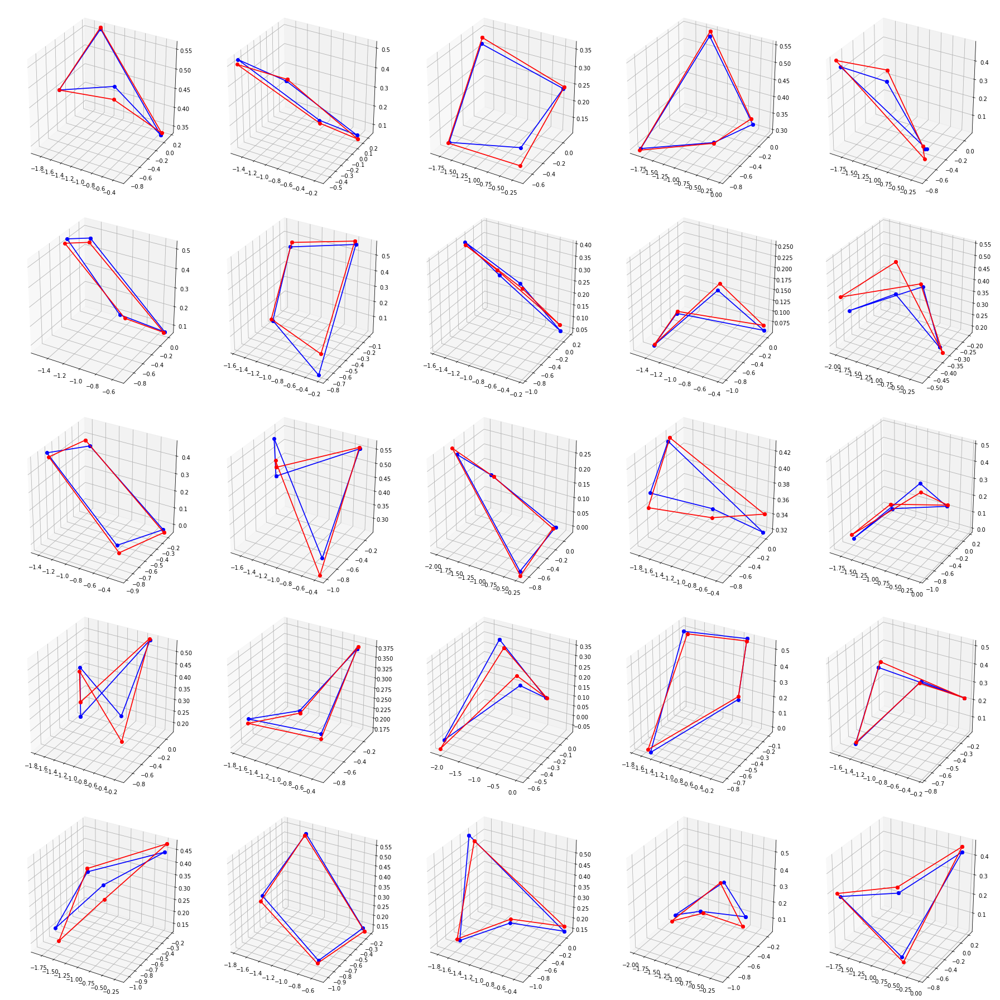

In [31]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(25,25))
which = 1000
howmany = 25.
for kk, f in enumerate(range(which,which+int(howmany))):
    ax = fig.add_subplot(5,5,kk+1, projection='3d')  

    coords = y_train[f,:12]
      
    #Horizontal lines in each layer
    coords = coords.reshape(4,3)
    ax.plot3D(coords[:,0], coords[:,1], coords[:,2],'o-b', linewidth=1.7, antialiased=True)
    ax.plot3D(coords[[0,3],0], coords[[0,3],1],coords[[0,3],2],'o-b', linewidth=1.7, antialiased=True)
    
    
    
    coords = y_pred_train[f,:12]
      
    #Horizontal lines in each layer
    coords = coords.reshape(4,3)
    ax.plot3D(coords[:,0], coords[:,1], coords[:,2],'o-r', linewidth=1.7, antialiased=True)
    ax.plot3D(coords[[0,3],0], coords[[0,3],1],coords[[0,3],2],'o-r', linewidth=1.7, antialiased=True)

plt.tight_layout()
plt.show()

# test multiple label random forest or XGBoost

# Test MLP where input is forces and output is forms (maybe even better if we take all from 12:87) as input

In [230]:
def next_batch(num, data, labels):
    '''
    Return a total of `num` random samples and labels. 
    '''
    idx = np.arange(0 , len(data))
    np.random.shuffle(idx)
    idx = idx[:num]
    data_shuffle = [data[ i] for i in idx]
    labels_shuffle = [labels[ i] for i in idx]

    return np.asarray(data_shuffle), np.asarray(labels_shuffle)


Xtr, Ytr = next_batch(5, X_train, y_train)
print('\n5 random samples')
print(Xtr.shape)
print(Ytr.shape)


5 random samples
(5, 4)
(5, 1)


Optimization Finished!


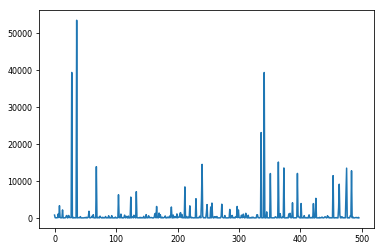

In [232]:
""" Neural Network.
A 2-Hidden Layers Fully Connected Neural Network (a.k.a Multilayer Perceptron)
implementation with TensorFlow. This example is using the MNIST database
of handwritten digits (http://yann.lecun.com/exdb/mnist/).
Links:
    [MNIST Dataset](http://yann.lecun.com/exdb/mnist/).
Author: Aymeric Damien
Project: https://github.com/aymericdamien/TensorFlow-Examples/
"""

from __future__ import print_function

# Import MNIST data
# from tensorflow.examples.tutorials.mnist import input_data
# mnist = input_data.read_data_sets("/tmp/data/", one_hot=True)

import tensorflow as tf

# Parameters
learning_rate = 1e-5
num_steps = 10000
batch_size = 10
display_step = 20

# Network Parameters
n_hidden_1 = 20 # 1st layer number of neurons
n_hidden_2 = 256 # 2nd layer number of neurons
n_hidden_3 = 64 # 2nd layer number of neurons
num_input = X_train.shape[1] # MNIST data input (img shape: 28*28)
num_classes = y_train.shape[1] # MNIST total classes (0-9 digits)

# tf Graph input
X = tf.placeholder("float", [None, num_input])
Y = tf.placeholder("float", [None, num_classes])

# Store layers weight & bias
weights = {
    'h1': tf.Variable(tf.random_uniform([num_input, n_hidden_1])),
#     'h2': tf.Variable(tf.random_uniform([n_hidden_1, n_hidden_2])),
#     'h3': tf.Variable(tf.random_uniform([n_hidden_2, n_hidden_3])),
    'out': tf.Variable(tf.random_uniform([n_hidden_1, num_classes]))
}
biases = {
    'b1': tf.Variable(tf.random_uniform([n_hidden_1])),
#     'b2': tf.Variable(tf.random_uniform([n_hidden_2])),
#     'b3': tf.Variable(tf.random_uniform([n_hidden_3])),
    'out': tf.Variable(tf.random_uniform([num_classes]))
}


# Create model
def neural_net(x):
    # Hidden fully connected layer with 256 neurons
    layer_1 = tf.add(tf.matmul(x, weights['h1']), biases['b1'])
    layer_1 = tf.nn.tanh(layer_1)
    # Hidden fully connected layer with 256 neurons
#     layer_2 = tf.add(tf.matmul(layer_1, weights['h2']), biases['b2'])
#     layer_2 = tf.nn.tanh(layer_2)
    
    
#     layer_3 = tf.add(tf.matmul(layer_2, weights['h3']), biases['b3'])
#     layer_3 = tf.nn.tanh(layer_3)
    # Output fully connected layer with a neuron for each class
    
    out_layer = tf.matmul(layer_1, weights['out']) + biases['out']
    return out_layer

# Construct model
# logits = neural_net(X)
# prediction = tf.nn.softmax(logits)

prediction = neural_net(X)

# Define loss and optimizer
# loss_op = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(
#     logits=logits, labels=Y))

# relative_error = (prediction-Y)/Y
relative_error = prediction-Y
loss_op = tf.reduce_mean(tf.pow(relative_error, 2))


optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate)
train_op = optimizer.minimize(loss_op)

# Evaluate model
# correct_pred = tf.equal(tf.argmax(prediction, 1), tf.argmax(Y, 1))
# accuracy = tf.reduce_mean(tf.cast(correct_pred, tf.float32))

# Initialize the variables (i.e. assign their default value)
init = tf.global_variables_initializer()

# Start training
with tf.Session() as sess:

    # Run the initializer
    sess.run(init)
    all_loss = []
    for step in range(1, num_steps+1):
        batch_x, batch_y = next_batch(batch_size, X_train, y_train)
        # Run optimization op (backprop)
        sess.run(train_op, feed_dict={X: batch_x, Y: batch_y})
        if step % display_step == 0 or step == 1:
            # Calculate batch loss and accuracy
            loss = sess.run([loss_op], feed_dict={X: batch_x,Y: batch_y})
            all_loss.append(loss)
#             print (loss[0])
#             print("Step " + str(step) + ", Minibatch Loss= " + \
#                   "{:.4f}".format(loss) + ", Training Accuracy= ")
#                   "{:.3f}".format(acc))
    y_pred = sess.run(prediction, feed_dict={X: X_test})
    y_pred_train = sess.run(prediction, feed_dict={X: X_train})
    print("Optimization Finished!")
plt.plot(all_loss[5:])    

In [233]:
loss_op

<tf.Tensor 'Mean_50:0' shape=() dtype=float32>

In [ ]:
plt.plot(y_pred_train[:,i],y_train[:,i],'.',markersize=1.4)

(3938,) 6400


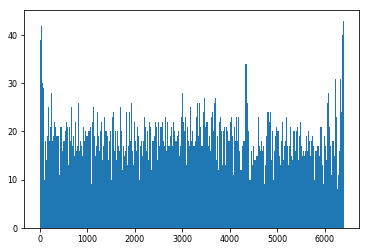

In [162]:
bmus = som.project_data(som.data_raw)
print np.unique(bmus).shape, som.nnodes
plt.hist(bmus,bins=300);

In [ ]:
cases = np.argwhere(bmus==bmu)

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(25,25))
which = 0
howmany = 50.
ax = fig.add_subplot(1,1,1, projection='3d')  
for kk, f in enumerate(range(which,which+int(howmany))):
    coords = DF.values[f,:12]
      
    #Horizontal lines in each layer
    coords = coords.reshape(4,3)
    ax.plot3D(coords[:,0], coords[:,1], coords[:,2],'o-',color=plt.cm.jet(f/howmany), linewidth=1.7, antialiased=True)
    ax.plot3D(coords[[0,3],0], coords[[0,3],1],coords[[0,3],2],color=plt.cm.jet(f/howmany), linewidth=1.7, antialiased=True)

plt.tight_layout()
plt.show()

In [53]:
ind_false = DF.ix[:,0]==False
ind_false

inds_form = range(1,1261)
form_DF = DF.ix[ind_false,inds_form]


inds_params = range(1261,DF.shape[1])
params_DF = DF.ix[ind_false,inds_params]


# form_DF = DF.ix[ind_false,9:]

# form_DF = form_DF.ix[:,:428]






# ind_false = DF.ix[:,21]==False
# ind_false
# form_DF = DF.ix[ind_false,28:]




form_DF = form_DF.ix[:,:]
form_DF.shape

(0, 1260)

In [6]:
params_DF.head()

,1261,1262,1263,1264,1265,1266,1267,1268,1269,1270,...,1279,1280,1281,1282,1283,1284,1285,1286,1287,1288
0,99,-41,13,34,89,14,0,82,0,25,...,2,6000.0,500.0,False,0.980731,1.515081,234.61,1.13184,5.686841e+06,4.460227e+09
1,99,-41,13,34,89,14,0,82,0,25,...,2,6000.0,500.0,False,0.980731,1.515081,234.61,1.13184,5.686841e+06,4.460227e+09
2,18,43,17,5,53,2,73,43,1,32,...,1,6000.0,500.0,False,0.995674,1.587234,310.847,0.878095,1.550933e+06,2.616112e+08
3,13,37,16,45,79,14,84,76,17,24,...,3,6000.0,500.0,False,0.933443,1.717564,33.5133,0.861083,1.051469e+06,7.554206e+08
7,64,35,2,22,73,3,97,47,5,26,...,3,6000.0,500.0,False,0.975783,1.276249,38.8212,0.0924258,1.922264e+06,6.302255e+08


In [7]:
form_DF.head()

,1,2,3,4,5,6,7,8,9,10,...,1251,1252,1253,1254,1255,1256,1257,1258,1259,1260
0,0.0,2.0,0.0,0.618034,1.902113,0.0,1.175571,1.618034,0.0,1.618034,...,-210.490456,-150.645647,106.479791,-203.216537,-163.751156,232.796428,-217.032530,-34.185061,116.318814,-189.890508
1,0.0,2.0,0.0,0.618034,1.902113,0.0,1.175571,1.618034,0.0,1.618034,...,-210.490456,-150.645647,106.479791,-203.216537,-163.751156,232.796428,-217.032530,-34.185061,116.318814,-189.890508
2,0.0,1.0,0.0,0.309017,0.951057,0.0,0.587785,0.809017,0.0,0.809017,...,-69.414170,-230.311887,168.541111,-65.907261,-134.797020,186.502325,-57.960583,-45.748511,147.664417,-47.487888
3,0.0,3.0,0.0,0.927051,2.853170,0.0,1.763356,2.427051,0.0,2.427051,...,-171.284639,-24.618123,22.692399,-164.847170,-62.381675,87.202966,-171.502718,2.225936,36.800524,-163.531110
7,0.0,3.0,0.0,0.927051,2.853170,0.0,1.763356,2.427051,0.0,2.427051,...,-83.343774,-92.614911,63.008682,-82.589685,-64.148658,88.164454,-81.789837,-14.771184,103.961102,-80.952521


In [8]:
# Vals = np.zeros((form_DF.shape[0],3*form_DF.shape[1]))

# for i in range(form_DF.shape[0]):
#     for j in range(form_DF.shape[1]):
#         vv = [float(cc) for cc in form_DF.values[i,j].split(',')]
#         Vals[i,3*j:3*j+3]= vv

In [9]:
Vals_normed  = form_DF.values[:]
for r,points in enumerate(form_DF.values[:]):
    points = points.reshape(21,20,3)
    mx = points.reshape(21*20,3).max(axis=0)
    mn = points.reshape(21*20,3).min(axis=0)
    Vals_normed[r] = ((points-mn)/(mx-mn)).flatten()

In [10]:
Vals_normed.shape

(17166, 1260)

## Form Visualization


#### As we discussed, we need a better visualization and to remove the redundant lines

In [11]:
which = 1000

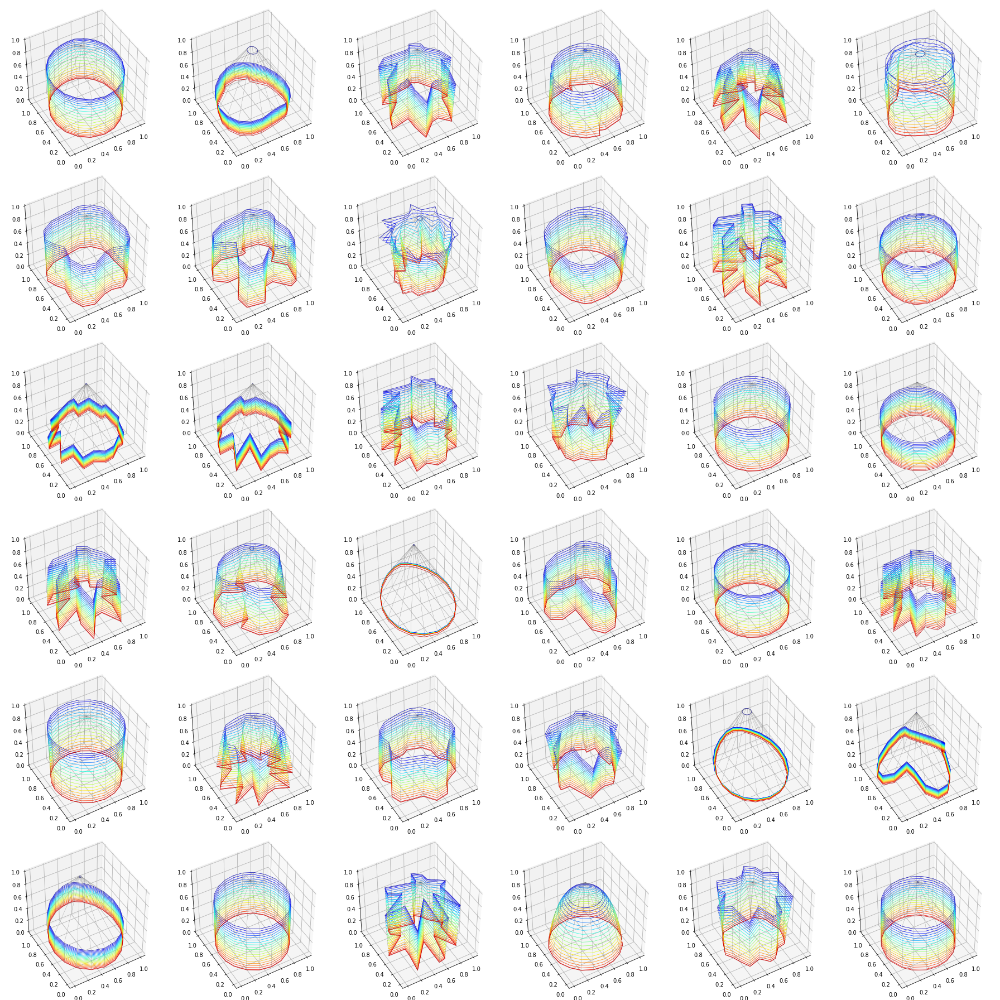

In [12]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(25,25))
for kk, f in enumerate(range(which,which+36)):
    coords = Vals_normed[f,:]
    ax = fig.add_subplot(6,6,kk+1, projection='3d')    
    #Horizontal lines in each layer
    coords = coords.reshape(21,20,3)
    for i in range(0,21):        
        ax.plot3D(coords[i,:,0], coords[i,:,1], coords[i,:,2],'-',color=plt.cm.jet(i/21.), linewidth=.7, antialiased=True)
        ax.plot3D(coords[i,[0,19],0], coords[i,[0,19],1],coords[i,[0,19],2],color=plt.cm.jet(i/21.), linewidth=0.7, antialiased=True)
    ax.view_init(45,240)
    
    
    coords = coords.flatten().reshape(21*20,3)
    for i in range(20):
            ind = range(i,21*20,20)
            ax.plot3D(coords[ind,0], coords[ind,1], coords[ind,2],'-',color='gray',linewidth=.3, antialiased=True)

plt.tight_layout()
plt.show()

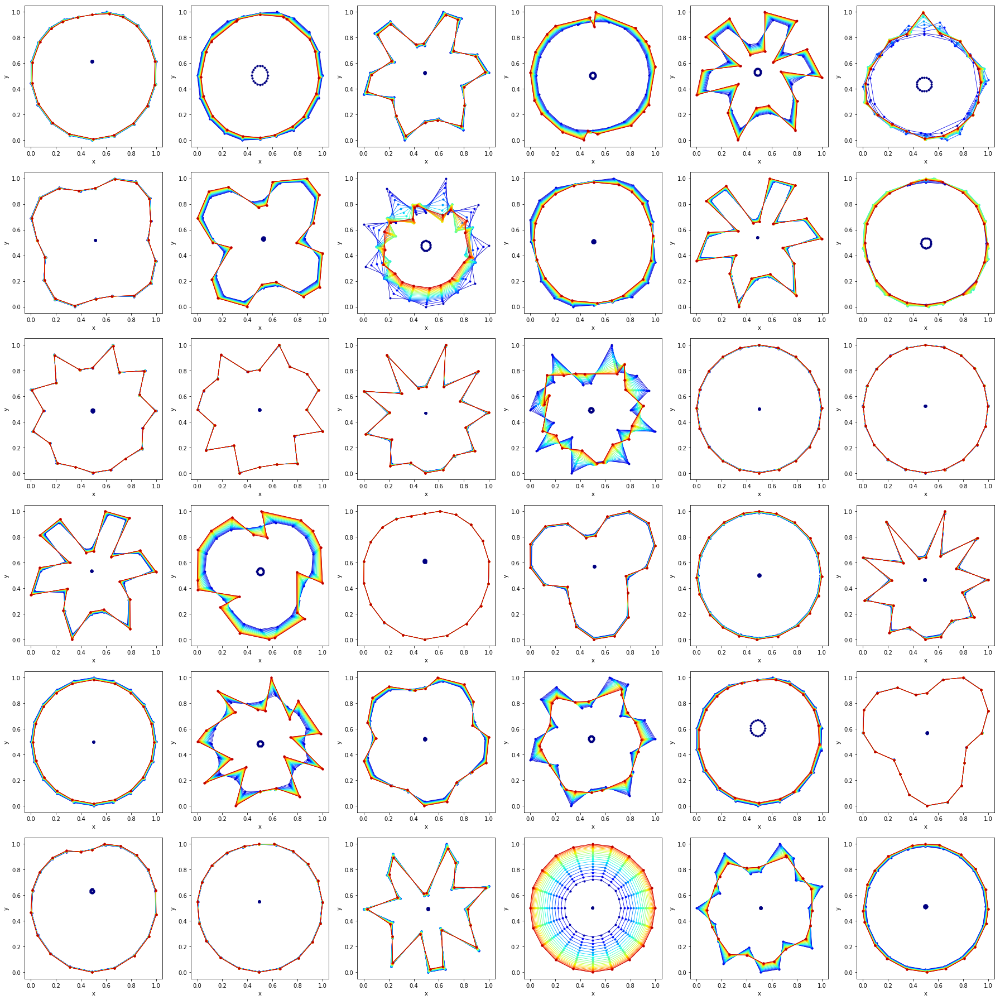

In [13]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(25,25))
for kk, f in enumerate(range(which,which+36)):
#     f = 101
    coords = Vals_normed[f,:]
    ax = fig.add_subplot(6,6,kk+1)    
    #Horizontal lines in each layer
    coords = coords.reshape(21,20,3)
    for i in range(0,21):
        ax.plot(coords[i,:,0], coords[i,:,1],'.-',color=plt.cm.jet(i/21.), linewidth=.8, antialiased=True)
        ax.plot(coords[i,[0,19],0], coords[i,[0,19],1],color=plt.cm.jet(i/21.), linewidth=0.7, antialiased=True)
#         ax.plot(coords[i,10:,0], coords[i,10:,1],'.-',color=plt.cm.jet(i/21.), linewidth=.8, antialiased=True)
        plt.xlabel('x')
        plt.ylabel('y')
#         
#     ax.view_init(45,240)

plt.tight_layout()
plt.show()

In [14]:
coords.shape

(21, 20, 3)

In [15]:
# from mpl_toolkits.mplot3d import Axes3D
# fig = plt.figure(figsize=(25,25))
# for kk, f in enumerate(range(which,which+36)):
#     coords = Vals_normed[f,:]
#     ax = fig.add_subplot(6,6,kk+1)    
#     #Horizontal lines in each layer
#     coords = coords.reshape(21,20,3)
#     for i in range(0,21):
#         ax.plot(coords[i,:,0], coords[i,:,2],'.-',color=plt.cm.jet(i/21.), linewidth=.8, antialiased=True)
#         plt.xlabel('x')
#         plt.ylabel('z')
# #         ax.plot3D(f_coords[[0,19],0], f_coords[[0,19],1], f_coords[[0,19],2],'.-b', linewidth=0.7, antialiased=True)
# #     ax.view_init(45,240)

# plt.tight_layout()
# plt.show()



# <a></a>
# <a></a>
# From this part on we can continue if we have proper data
# <a></a>
# <a></a>

## Training a SOM with form data


## Input Data
### 1- Just x,y,z coordinates for now 
### 2- As images, where xyz in each node corresponds to rgb in each pixel then we need Convolutional Nueral Nets to compare images
### 3- Maybe just some fourier analysis on these wave like patterns

In [16]:



###############
# For this we need a proper data set as csv
###############


import sompylib.sompy as SOM
msz10 = 80
msz11 =80

indkeep = set(range(Vals_normed.shape[1])).difference(set(range(2,Vals_normed.shape[0],3)))
indkeep = list(indkeep)


X = Vals_normed[:,indkeep].astype(float)
print X.shape
som = SOM.SOM('', X[:], mapsize = [msz10, msz11],norm_method = 'var',initmethod='pca')
som.train(n_job = 1, shared_memory = 'no',verbose='final')

(17166, 840)

Total time elapsed: 180.509000 secodns
final quantization error: 4.790363


(5499,) 6400


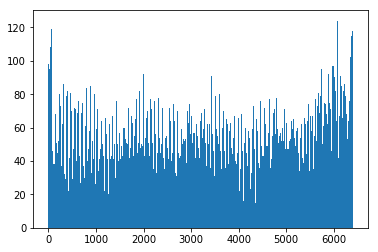

In [17]:
bmus = som.project_data(som.data_raw)
print np.unique(bmus).shape, som.nnodes
plt.hist(bmus,bins=300);

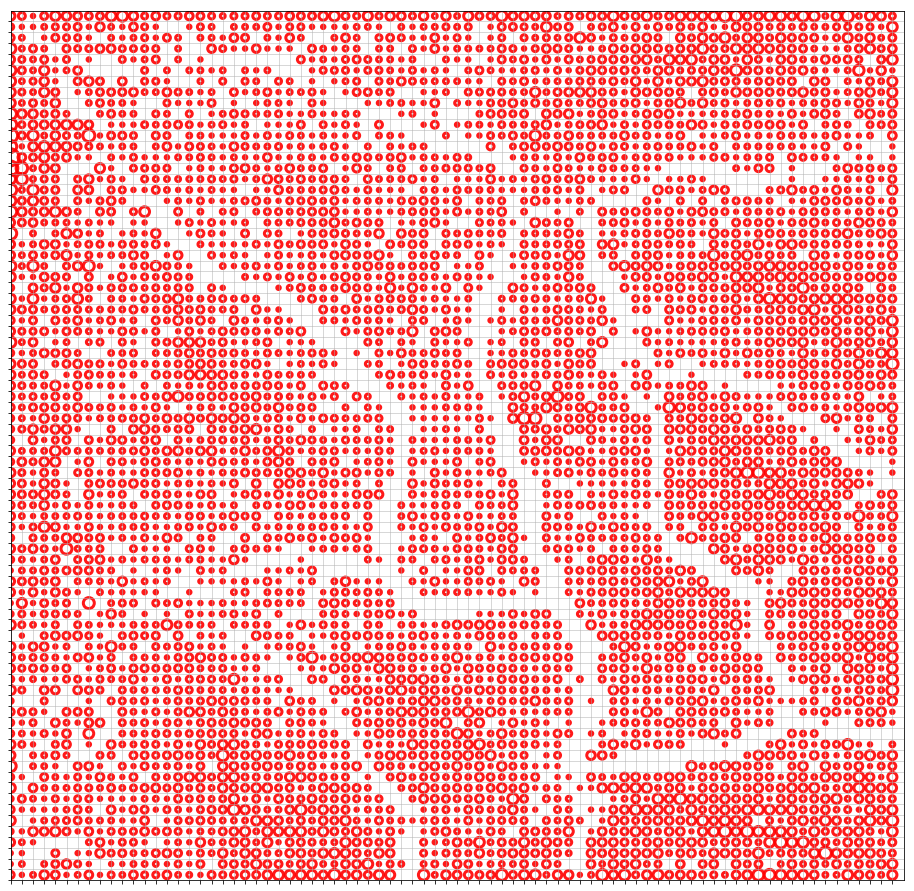

In [18]:
som.hit_map()

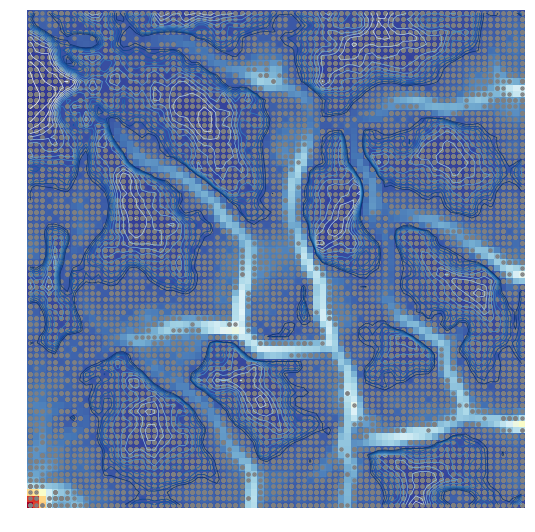

In [19]:
U = som.view_U_matrix(distance2=2, row_normalized='No', show_data='Yes', contooor='Yes', blob='No', save='No', save_dir='')

In [23]:
from mpl_toolkits.mplot3d import Axes3D
bmu = 370
fig = plt.figure(figsize=(120,120))

for bmu in range(som.nnodes):

    cases = np.argwhere(bmus==bmu)
    try:
        coords = Vals_normed[cases[0],:]
        ax = fig.add_subplot(som.mapsize[0],som.mapsize[0],bmu+1, projection='3d')    
        #Horizontal lines in each layer
        coords = coords.reshape(21,20,3)
        for i in range(0,21):        
#             ax.plot3D(coords[i,:,0], coords[i,:,1], coords[i,:,2],'-',color=plt.cm.jet(.1), linewidth=.3, antialiased=True)
#             ax.plot3D(coords[i,[0,19],0], coords[i,[0,19],1],coords[i,[0,19],2],color=plt.cm.jet(.1), linewidth=0.3, antialiased=True)
            ax.plot3D(coords[i,:,0], coords[i,:,1], coords[i,:,2],'-',color=plt.cm.jet(i/21.), linewidth=.7, antialiased=True)
            ax.plot3D(coords[i,[0,19],0], coords[i,[0,19],1],coords[i,[0,19],2],color=plt.cm.jet(i/21.), linewidth=0.7, antialiased=True)
        
#         coords = coords.flatten().reshape(21*20,3)
#         for i in range(20):
#             ind = range(i,21*20,20)
#             ax.plot3D(coords[ind,0], coords[ind,1], coords[ind,2],'-',color=plt.cm.jet(.1),linewidth=.3, antialiased=True)

        
        ax.view_init(45,240)
        plt.axis('off')
        if bmu%100==0:
            print bmu
    except:
        continue
plt.tight_layout(h_pad=.0001, w_pad=.0001 )

fig.savefig('./images/SOM_'+str(som.mapsize[0])+'_'+str(som.mapsize[0])+'.png',dpi=200)
plt.close()
    

0
100
200
300


In [40]:
from mpl_toolkits.mplot3d import Axes3D
bmu = 370

for bmu in range(0,10,10):

    fig = plt.figure(figsize=(25,25))

    cases = np.argwhere(bmus==bmu)

#     print (len(cases))

    for f in range(36):
        try:
            coords = Vals_normed[cases[f],:]
            ax = fig.add_subplot(6,6,f+1, projection='3d')    
            #Horizontal lines in each layer
            coords = coords.reshape(21,20,3)
            coords = coords.reshape(21,20,3)
            for i in range(0,21):        
#                 ax.plot3D(coords[i,:,0], coords[i,:,1], coords[i,:,2],'-',color='gray', linewidth=.7, antialiased=True)
#                 ax.plot3D(coords[i,[0,19],0], coords[i,[0,19],1],coords[i,[0,19],2],color='gray', linewidth=0.7, antialiased=True)
                ax.plot3D(coords[i,:,0], coords[i,:,1], coords[i,:,2],'-',color=plt.cm.jet(i/21.), linewidth=.7, antialiased=True)
                ax.plot3D(coords[i,[0,19],0], coords[i,[0,19],1],coords[i,[0,19],2],color=plt.cm.jet(i/21.), linewidth=0.7, antialiased=True)
        
            coords = coords.flatten().reshape(21*20,3)
            for i in range(20):
                ind = range(i,21*20,20)
                ax.plot3D(coords[ind,0], coords[ind,1], coords[ind,2],'-',color='gray',linewidth=.3, antialiased=True)

            ax.view_init(45,240)
        except:
            continue
    plt.tight_layout()
    fig.savefig('./images/newstuff/'+str(bmu)+'.png',dpi=200)
    plt.close()
    print bmu

0


# A test with UMAP
https://github.com/lmcinnes/umap

In [15]:
import umap
embedding = umap.UMAP(n_components=2).fit_transform(X)

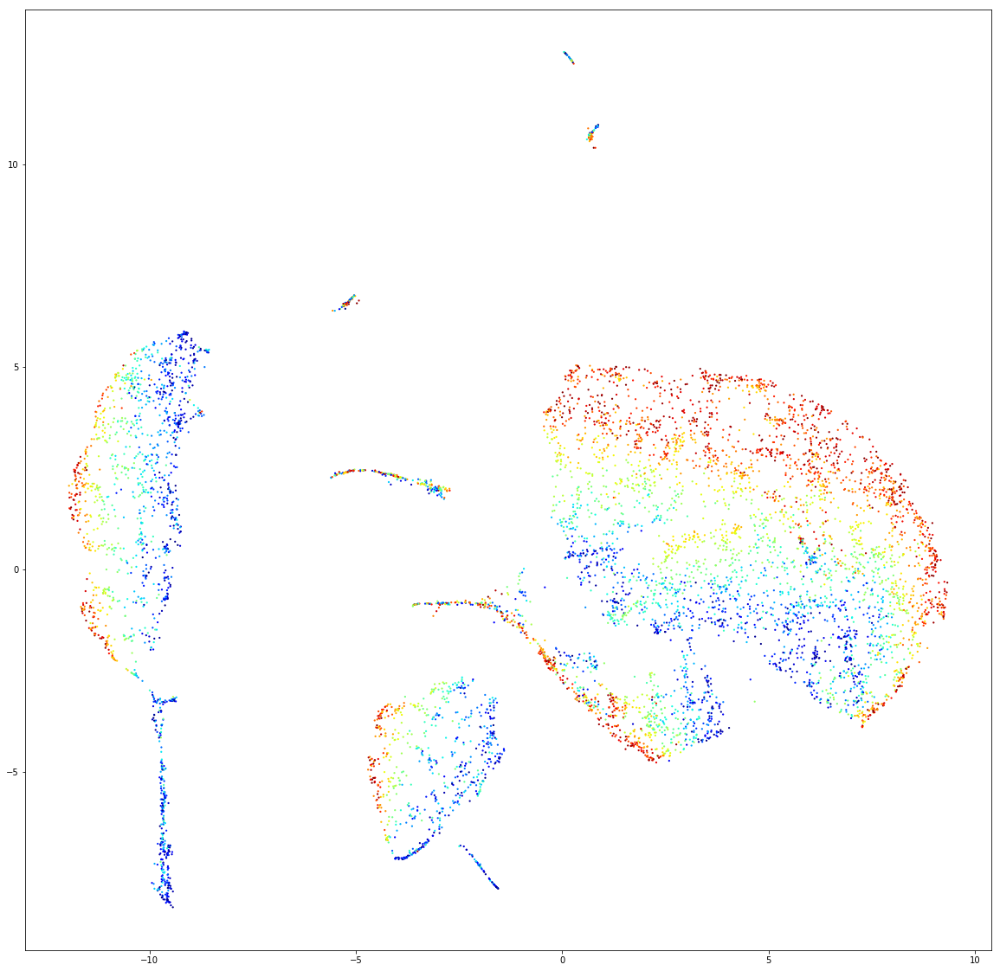

In [18]:
fig = plt.figure(figsize=(20,20))
# plt.plot(embedding[:,0],embedding[:,1],'.');
col =1
plt.scatter(embedding[:,0],embedding[:,1],s=5,c=DF.ix[:,col].values[:].astype(float),cmap=plt.cm.jet,edgecolor='None',marker='o',alpha=1.);
# plt.title()

In [28]:
columns = params_DF.columns.values[:]
print columns.shape

std = params_DF.describe().ix['std']
std_zero = np.where(std<=0)[0]
std_zero

indNan  = np.where(params_DF.values[:]=='None')
col_nan = np.unique(indNan[1])

remove_cols =  list(std_zero)+list(col_nan)
print remove_cols
columns[remove_cols]

sel_cols = list(set(params_DF.columns.values[:]).difference(columns[remove_cols]))
print sel_cols
params_DF[sel_cols].shape

(28,)
[19, 20, 24, 25]
[1282, 1283, 1284, 1287, 1288, 1261, 1262, 1263, 1264, 1265, 1266, 1267, 1268, 1269, 1270, 1271, 1272, 1273, 1274, 1275, 1276, 1277, 1278, 1279]


(17166, 24)

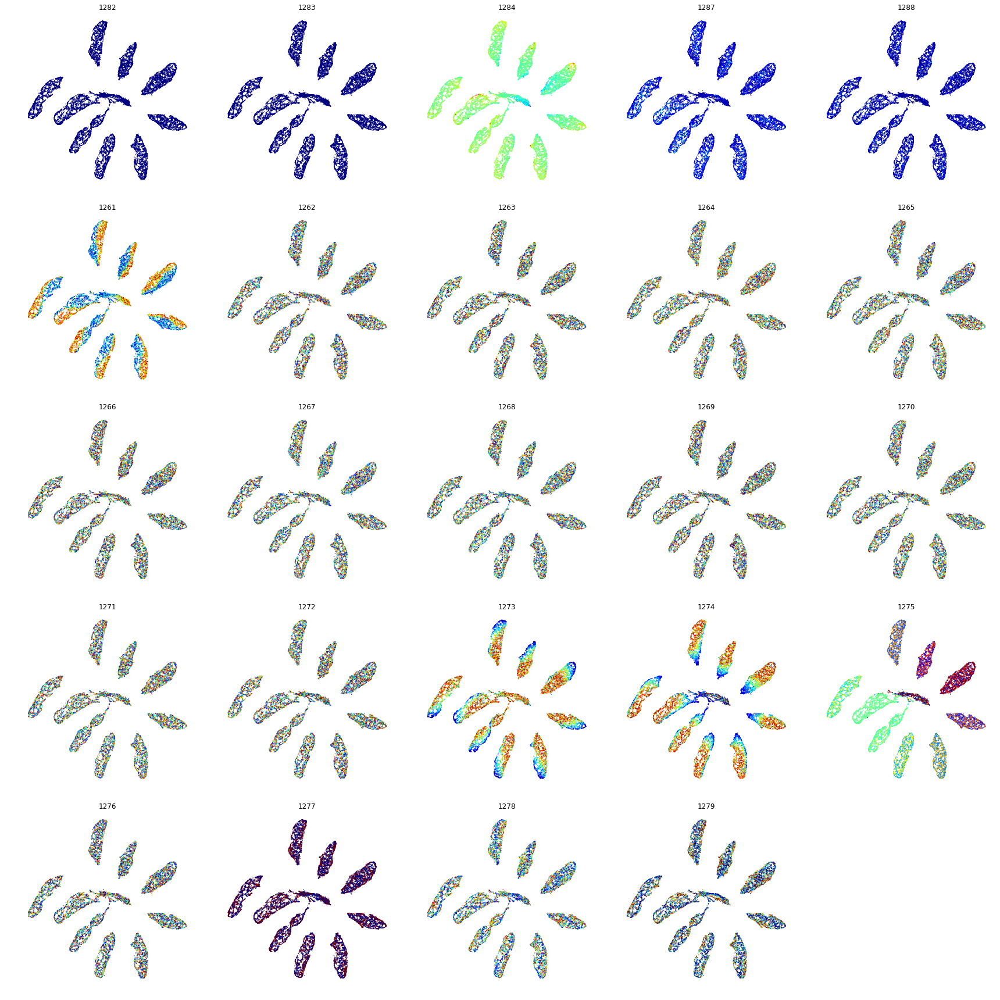

In [40]:
fig = plt.figure(figsize=(24,24))
data = embedding.copy()
for i,col in enumerate(params_DF[sel_cols].columns[:]):    
    plt.subplot(5,5,i+1)
    plt.axis('off')
    plt.scatter(data[:,0],data[:,1],s=2,c=params_DF.ix[:,col].values[:].astype(float),cmap=plt.cm.jet,edgecolor='None',marker='o',alpha=1.);
    plt.title(col)
plt.tight_layout()
fig.savefig('./images/UMAP.png',dpi=250)

In [77]:
# from bokeh.plotting import figure, show, output_file
# from bokeh.sampledata.iris import flowers

# vals=  params_DF.ix[:,col].values[:].astype(float)
# mn = vals.min()
# mx = vals.max()
# # vals = (vals-mn)/(mx-mn)

# colors = [plt.cm.jet(val) for val in vals]

# p = figure(title = "Iris Morphology")
# p.xaxis.axis_label = 'Petal Length'
# p.yaxis.axis_label = 'Petal Width'

# p.circle(embedding[:,0], embedding[:,1],
#          color=colors, fill_alpha=1, size=5,line_color=None)

# output_file("iris.html", title="iris.py example")

# show(p)

In [41]:
embedding3d = umap.UMAP(n_components=3).fit_transform(X)

0.0 30.0


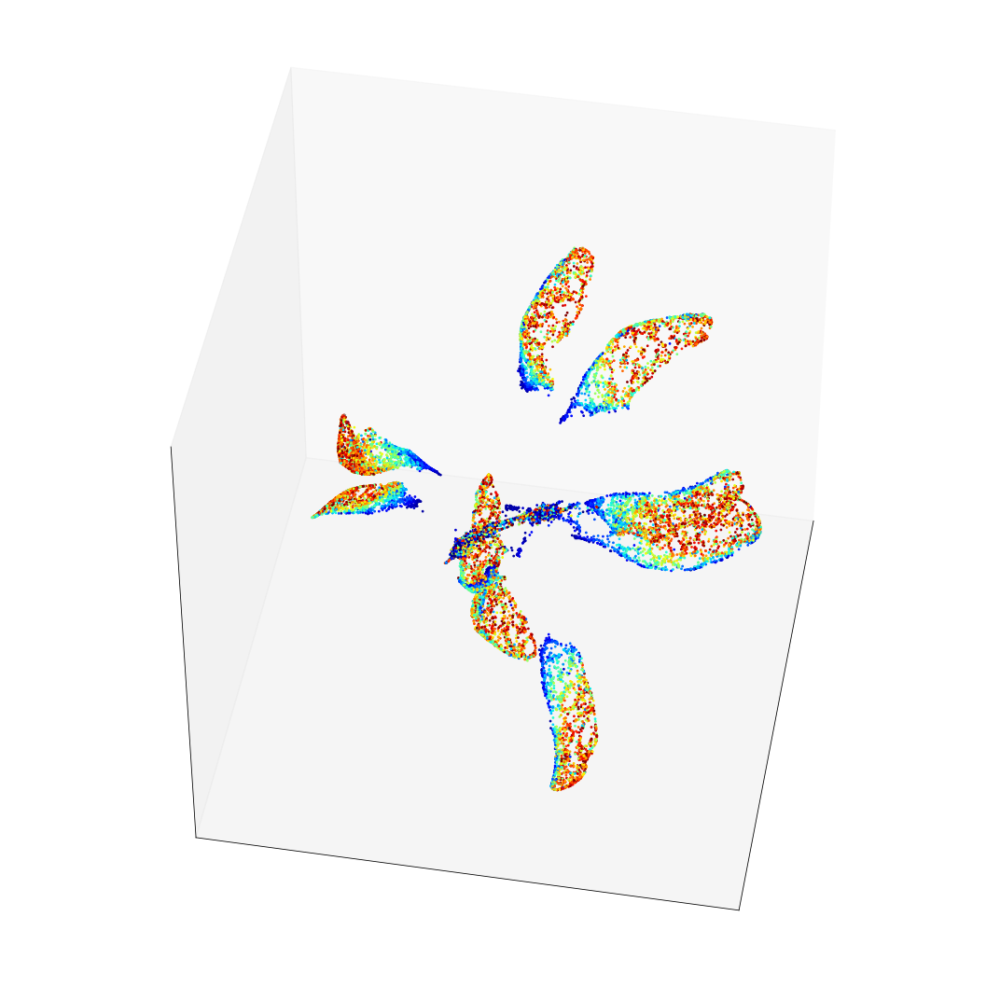

In [60]:
from mpl_toolkits.mplot3d import Axes3D
col =1274
fig = plt.figure(figsize=(15,15))
vals=  params_DF.ix[:,col].values[:].astype(float)
print vals.min(),vals.max()
ax = fig.add_subplot(1,1,1,projection='3d')  
ax.scatter(embedding3d[:,0],embedding3d[:,1],embedding3d[:,2],s=3,c=vals,vmin=vals.min(),vmax=vals.max(),cmap=plt.cm.jet,edgecolors=None,marker='o',alpha=1.);
ax.view_init(45,190)
# plt.axis('off')
plt.xticks([])
plt.yticks([])
ax.set_zticks([])
plt.tight_layout()
plt.show()

In [ ]:
fig = plt.figure(figsize=(20,20))
# plt.plot(embedding[:,0],embedding[:,1],'.');
col =1274
plt.scatter(embedding[:,0],embedding[:,1],s=5,c=params_DF.ix[:,col].values[:].astype(float),cmap=plt.cm.jet,edgecolor='None',marker='o',alpha=1.);
plt.title()

# Now to visualize the design parameters on the trained SOM of forms

In [24]:
# TO BE DONE

# And also, just one SOM based on design parameters
### Unfortunately, most of these values are not consistent or useful. Some are None, some have mixed logical values and some no variations


# 1- Let's see if the input params have connections to falsification of the results

In [46]:

inds_params_all = range(1261,DF.shape[1])

all_params_DF = DF.ix[:,inds_params_all]
all_params_DF.head()

,1261,1262,1263,1264,1265,1266,1267,1268,1269,1270,...,1279,1280,1281,1282,1283,1284,1285,1286,1287,1288
0,99,-41,13,34,89,14,0,82,0,25,...,2,6000.0,500.0,False,0.980731,1.515081,234.61,1.13184,5.686841e+06,4.460227e+09
1,99,-41,13,34,89,14,0,82,0,25,...,2,6000.0,500.0,False,0.980731,1.515081,234.61,1.13184,5.686841e+06,4.460227e+09
2,18,43,17,5,53,2,73,43,1,32,...,1,6000.0,500.0,False,0.995674,1.587234,310.847,0.878095,1.550933e+06,2.616112e+08
3,13,37,16,45,79,14,84,76,17,24,...,3,6000.0,500.0,False,0.933443,1.717564,33.5133,0.861083,1.051469e+06,7.554206e+08
4,97,15,15,72,5,1,72,73,13,0,...,3,6000.0,500.0,True,0.839307,1.063944,8.43853,3.07966,2.263805e+06,9.561330e+08


In [47]:
columns = all_params_DF.columns.values[:]
print columns.shape

(28,)


In [48]:
std = all_params_DF.describe().ix['std']
std_zero = np.where(std<=0)[0]
std_zero

array([19, 20])

In [49]:
indNan  = np.where(params_DF.values[:]=='None')
col_nan = np.unique(indNan[1])

remove_cols =  list(std_zero)+list(col_nan)
print remove_cols
columns[remove_cols]

[19, 20, 24, 25]


array([1280, 1281, 1285, 1286])

In [51]:
sel_cols = list(set(all_params_DF.columns.values[:]).difference(columns[remove_cols]))
print sel_cols
all_params_DF[sel_cols].head()

[1282, 1283, 1284, 1287, 1288, 1261, 1262, 1263, 1264, 1265, 1266, 1267, 1268, 1269, 1270, 1271, 1272, 1273, 1274, 1275, 1276, 1277, 1278, 1279]


,1282,1283,1284,1287,1288,1261,1262,1263,1264,1265,...,1270,1271,1272,1273,1274,1275,1276,1277,1278,1279
0,False,0.980731,1.515081,5.686841e+06,4.460227e+09,99,-41,13,34,89,...,25,69,5,23,28,8,7,1,4.107548,2
1,False,0.980731,1.515081,5.686841e+06,4.460227e+09,99,-41,13,34,89,...,25,69,5,23,28,8,7,1,4.107548,2
2,False,0.995674,1.587234,1.550933e+06,2.616112e+08,18,43,17,5,53,...,32,20,12,21,22,3,1,0,1.341576,1
3,False,0.933443,1.717564,1.051469e+06,7.554206e+08,13,37,16,45,79,...,24,52,10,14,8,9,6,1,3.854516,3
4,True,0.839307,1.063944,2.263805e+06,9.561330e+08,97,15,15,72,5,...,0,76,6,7,28,19,4,0,4.088559,3


In [52]:



###############
# For this we need a proper data set as csv
###############


import sompylib.sompy as SOM
msz10 = 30
msz11 =30

# indkeep = set(range(Vals_normed.shape[1])).difference(set(range(2,Vals_normed.shape[0],3)))
# indkeep = list(indkeep)


# X = Vals_normed[:,indkeep].astype(float)

Y = all_params_DF[sel_cols].values[:].astype(float)

print Y.shape
som_design_params = SOM.SOM('', Y[:], mapsize = [msz10, msz11],norm_method = 'var',initmethod='pca')
som_design_params.train(n_job = 1, shared_memory = 'no',verbose='final')
som_design_params.compname=[sel_cols]

(27641, 24)

Total time elapsed: 0.850000 secodns
final quantization error: 3.991697


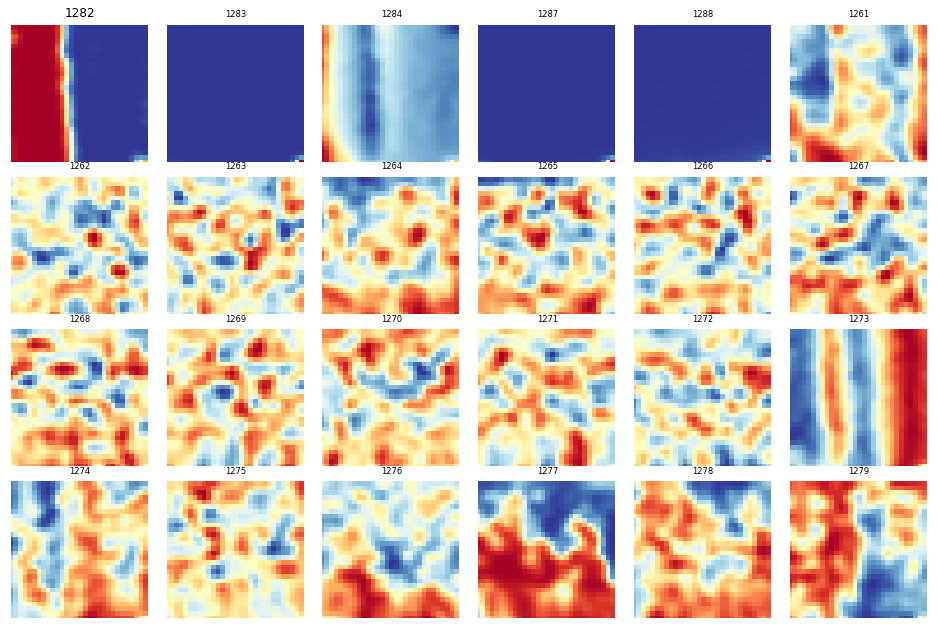

In [53]:
som_design_params.view_map(text_size=7)

In [34]:
def viewmap(som,data=None):
    
    codebook_denorm = SOM.denormalize_by(som.data_raw,som.codebook)
#     bmus = som.project_data(som.data_raw)
#     cb = []
#     for i in range(som.nnodes):
#         indbm = bmus==i
#         cb.append(np.mean(som.data_raw[indbm],axis=0))
#     codebook_denorm = np.asarray(cb)
    
    msz =  getattr(som, 'mapsize')
    dim = som.codebook.shape[1]
    no_row_in_plot = dim/6 + 1 #6 is arbitrarily selected
    if no_row_in_plot <=1:
        no_col_in_plot = dim
    else:
        no_col_in_plot = 12
    
    h = .1
    w= .1
    fig = plt.figure(figsize=(no_col_in_plot*3.0*(1+w),no_row_in_plot*3.0*(1+h)))
    for k in range(dim):
        ax = plt.subplot(no_row_in_plot,no_col_in_plot,k+1)
        ax.set_yticklabels([])
        ax.set_xticklabels([])
#         vmn = som.data_raw[:,k].min()
#         vmx = som.data_raw[:,k].max()
        vmx = codebook_denorm[:,k].max()
        vmn = codebook_denorm[:,k].min()
        pl = ax.imshow(codebook_denorm[:,k].reshape(msz[0],msz[1])[::-1],alpha=1,cmap=plt.cm.RdYlBu_r,vmin=vmn,vmax=vmx)
        ax.set_yticklabels([])
        ax.set_xticklabels([])
#         print som.compname[k]
        plt.title(som.compname[0][k])
        ax.axis('off')
        plt.colorbar(pl,shrink=.7)
#         ax.imshow(som.codebook[:,k].reshape(msz[0],msz[1])[::],alpha=1,cmap=plt.cm.Accent_r)
#     plt.subplots_adjust(hspace = .01,wspace=.01)
    plt.tight_layout()
#     plt.savefig("./som.png",dpi=300)
font = {'family' : 'normal',
#         'weight' : 'bold',
        'size'   : 10}

plt.rc('font', **font)

In [35]:
bmus = som_design_params.project_data(som_design_params.data_raw)
print ('size of unique bmus: {} out of {}'.format(np.unique(bmus).shape[0],som_design_params.nnodes))
# plt.hist(bmus,bins=100);
xy = som_design_params.ind_to_xy(bmus)[:,:2]
xy = 2500*xy + 150*np.random.randn(xy.shape[0],xy.shape[1])

xy.shape

size of unique bmus: 885 out of 900


(27641, 2)

In [39]:
import random
ind_row_test = random.sample(range(Y.shape[0]),1000)

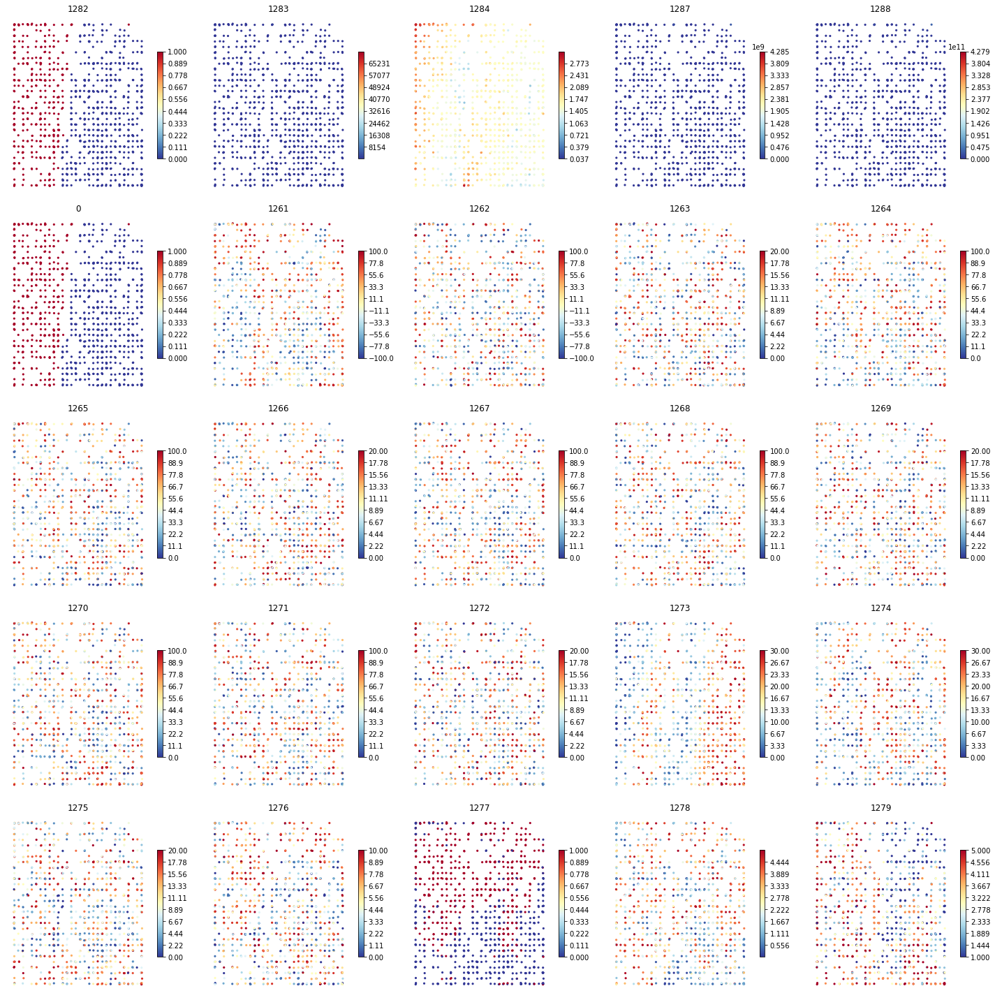

In [42]:
fig = plt.figure(figsize=(20,20))


for i in range(som_design_params.data_raw.shape[1]):
    ax = plt.subplot(5,5,i+1)
    vals = Y[:,i]
    
    
    mn = vals.min()
    mx = vals.max()
#     vals= (vals-vmn)/(vmx-vmn)
    sc = plt.scatter(xy[ind_row_test,1],xy[ind_row_test,0],c=vals[ind_row_test],s=10,edgecolor='None',marker='o',alpha=1.,vmin=mn,vmax=mx,cmap=plt.cm.RdYlBu_r);
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    ax.axis('off')
    plt.title(str(som_design_params.compname[0][i]))
    plt.colorbar(sc,ticks=np.round(np.linspace(mn,mx,10),decimals=3),shrink=0.6)
    
    
plt.tight_layout()
    
    

# Using a classifier to detect the false/true results in the forms

In [73]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split


X_ = Y[:,1:]
y_ = Y[:,0]

X_train, X_test, y_train, y_test = train_test_split(X_, y_, train_size=.75)
clf = RandomForestClassifier(n_estimators=40)
clf.fit(X_train, y_train)

print(clf.feature_importances_)
y_pred = clf.predict(X_test)

[ 0.25266088  0.14112121  0.03981944  0.0339969   0.04154065  0.02301365
  0.01650351  0.02943724  0.02049688  0.01610494  0.02259141  0.02040798
  0.01559377  0.01897708  0.01952913  0.01545613  0.06442777  0.04033151
  0.02725448  0.02291681  0.03381821  0.04561397  0.03838646]


In [74]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test,y_pred)

array([[3967,  331],
       [ 499, 2114]])

In [75]:
clf.score(X_test,y_test)

0.8799016061351469

In [13]:
columns = params_DF.columns.values[:]
print columns.shape

(28,)


In [118]:
params_DF.head()

,1261,1262,1263,1264,1265,1266,1267,1268,1269,1270,...,1279,1280,1281,1282,1283,1284,1285,1286,1287,1288
0,99,-41,13,34,89,14,0,82,0,25,...,2,6000.0,500.0,False,0.980731,1.515081,234.61,1.13184,5.686841e+06,4.460227e+09
1,99,-41,13,34,89,14,0,82,0,25,...,2,6000.0,500.0,False,0.980731,1.515081,234.61,1.13184,5.686841e+06,4.460227e+09
2,18,43,17,5,53,2,73,43,1,32,...,1,6000.0,500.0,False,0.995674,1.587234,310.847,0.878095,1.550933e+06,2.616112e+08
3,13,37,16,45,79,14,84,76,17,24,...,3,6000.0,500.0,False,0.933443,1.717564,33.5133,0.861083,1.051469e+06,7.554206e+08
7,64,35,2,22,73,3,97,47,5,26,...,3,6000.0,500.0,False,0.975783,1.276249,38.8212,0.0924258,1.922264e+06,6.302255e+08


In [115]:
std = params_DF.describe().ix['std']
std_zero = np.where(std<=1)[0]

In [120]:
indlog  = np.where(params_DF.values[:]==False)
print indlog
col_log = np.unique(indlog[1])
col_log

(array([    0,     0,     0, ..., 17165, 17165, 17165]), array([ 6,  8, 21, ...,  2, 16, 21]))


array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       21])

In [121]:
indNan  = np.where(params_DF.values[:]=='None')
col_nan = np.unique(indNan[1])

remove_cols = list(col_log)+ list(std_zero)+list(col_nan)
print remove_cols
columns[remove_cols]

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 21, 16, 19, 20, 22, 24, 25]


array([1261, 1262, 1263, 1264, 1265, 1266, 1267, 1268, 1269, 1270, 1271,
       1272, 1273, 1274, 1275, 1276, 1277, 1282, 1277, 1280, 1281, 1283,
       1285, 1286])

In [122]:
sel_cols = list(set(params_DF.columns.values[:]).difference(columns[remove_cols]))
print sel_cols
params_DF[sel_cols].head()

[1284, 1287, 1288, 1278, 1279]


,1284,1287,1288,1278,1279
0,1.515081,5.686841e+06,4.460227e+09,4.107548,2
1,1.515081,5.686841e+06,4.460227e+09,4.107548,2
2,1.587234,1.550933e+06,2.616112e+08,1.341576,1
3,1.717564,1.051469e+06,7.554206e+08,3.854516,3
7,1.276249,1.922264e+06,6.302255e+08,2.893049,3


In [123]:
params_DF[sel_cols].describe().ix['std']

1284    2.088674e-01
1287    1.585682e+06
1288    9.766916e+08
1278    1.448634e+00
1279    1.383815e+00
Name: std, dtype: float64

In [131]:



###############
# For this we need a proper data set as csv
###############


import sompylib.sompy as SOM
msz10 = 30
msz11 =30

# indkeep = set(range(Vals_normed.shape[1])).difference(set(range(2,Vals_normed.shape[0],3)))
# indkeep = list(indkeep)


# X = Vals_normed[:,indkeep].astype(float)

Y = params_DF[sel_cols].values[:].astype(float)

print Y.shape
som_design_params = SOM.SOM('', Y[:], mapsize = [msz10, msz11],norm_method = 'var',initmethod='pca')
som_design_params.train(n_job = 1, shared_memory = 'no',verbose='final')
som_design_params.compname=[sel_cols]

(17166, 5)

Total time elapsed: 0.802000 secodns
final quantization error: 0.540023


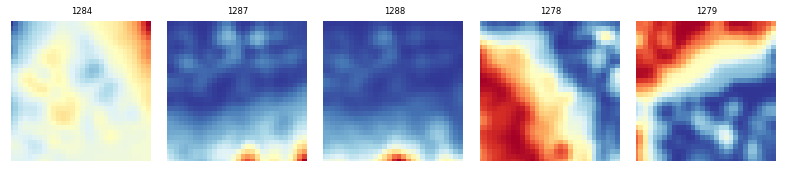

In [132]:
som_design_params.view_map(text_size=7)

# Let's color the forms based on one of these parameters

In [139]:
colors = params_DF[sel_cols].values[:]
mn = colors.min(axis=0)
mx = colors.max(axis=0)
colors = (colors-mn)/(mx-mn)
np.max(colors)
# colors = SOM.normalize(colors)

1.0

In [25]:
from mpl_toolkits.mplot3d import Axes3D
bmu = 370
fig = plt.figure(figsize=(50,50))
sel_color =  4
for bmu in range(som.nnodes):

    cases = np.argwhere(bmus==bmu)
    try:
        coords = Vals_normed[cases[0],:]
        ax = fig.add_subplot(som.mapsize[0],som.mapsize[0],bmu+1, projection='3d')    
        #Horizontal lines in each layer
        coords = coords.reshape(21,20,3)
        for i in range(0,21):        
            ax.plot3D(coords[i,:,0], coords[i,:,1], coords[i,:,2],'-',color=plt.cm.jet(colors[cases[0],sel_color][0]), linewidth=.5, antialiased=True)
            ax.plot3D(coords[i,[0,19],0], coords[i,[0,19],1],coords[i,[0,19],2],color=plt.cm.jet(colors[cases[0],sel_color][0]), linewidth=0.5, antialiased=True)
        
        coords = coords.flatten().reshape(21*20,3)
        for i in range(20):
            ind = range(i,21*20,20)
            ax.plot3D(coords[ind,0], coords[ind,1], coords[ind,2],'-',color=plt.cm.jet(colors[cases[0],sel_color][0]),linewidth=.5, antialiased=True)

        
        ax.view_init(45,240)
        plt.axis('off')
        if bmu%100==0:
            print bmu
    except:
        continue
plt.tight_layout(h_pad=.0001, w_pad=.0001 )

fig.savefig('./images/colored_by_params/SOM_which_params_'+str(sel_cols[sel_color])+'_'+str(som.mapsize[0])+'_'+str(som.mapsize[0])+'.png',dpi=300)
plt.close()
    